#### Introduction ####

This notebook deals with Semantic Segmentation, or pixel-wise segmentation for finding defects in a given steel image. The data is take from the [Severstal Steel Defect Detection Competition](https://www.kaggle.com/competitions/severstal-steel-defect-detection). In the datasets we have 4 different classes and there are large number of images with no defects present which we found doing eda.  We will create a model for defect 3 at first then we will create model for other defects likewise. We will use U-net Architecture for this task.



**Table of Contents**

1. Data Processing
2. Model Building and Training
3. Prediction on the Test Set

## 1. Data Processing ##

📌 I load the libraries to be used for the project.

The references/resources for this project are the following:  
1] [U-Net Paper](https://paperswithcode.com/paper/u-net-convolutional-networks-for-biomedical): This is a research paper titled: *U-Net: Convolutional Networks for Biomedical Image Segmentation*         
2] [PyTorch Implementation of U-Net](https://nn.labml.ai/unet/index.html): This is a helpful resource for the coding details of U-Net using PyTorch. The link was given at the first U-Net Paper link.   
3] [U-Net for Brain MRI](https://pytorch.org/hub/mateuszbuda_brain-segmentation-pytorch_unet/) : This is where I get the modified U-Net Architecture that I used for this project.     
4] [Loss Function Library - Keras & PyTorch](https://www.kaggle.com/code/bigironsphere/loss-function-library-keras-pytorch/notebook#Focal-Loss) : This is Kaggle Notebook, from which I brought the *Dice - BCE Loss* Function.  

In [10]:
import pandas as pd
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib
from PIL import Image

import torch
from torch import nn
from torch import optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
import torch.nn.functional as F
from tqdm import tqdm
from time import sleep

## 📌 Loading data

In [11]:
folder_path = '/kaggle/input/severstal-steel-defect-detection/'
images_path = folder_path + 'train_images/' 

tab = pd.read_csv(folder_path+'train.csv')
c = 4
tab = tab[tab['ClassId'] == c].copy()
tab = tab.reset_index().drop('index', axis = 1)
image_list = tab['ImageId'].unique()
tab

,ImageId,ClassId,EncodedPixels
0,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
1,0025bde0c.jpg,4,315139 8 315395 15 315651 16 315906 17 316162 ...
2,002af848d.jpg,4,290800 6 291055 13 291311 15 291566 18 291822 ...
3,0030401a5.jpg,4,186833 1 187089 3 187344 6 187600 7 187855 10 ...
4,008621629.jpg,4,215548 3 215798 9 216051 12 216306 13 216560 1...
...,...,...,...
796,fda1a539d.jpg,4,128621 3 128876 8 129131 11 129386 13 129641 1...
797,fdb7c0397.jpg,4,155020 6 155268 16 155516 27 155764 37 156012 ...
798,feec56162.jpg,4,99346 1 99602 1 99858 1 100113 2 100369 3 1006...
799,ff6bfada2.jpg,4,90877 2 91131 4 91385 6 91638 9 91892 12 92146...


📌 The following is a function that converts **'running pixels'** to a 256 x 1600 matrix (same as image size), that shows the location of defect in an image (0: non-defect pixel, 1: defect pixel). Description of the running pixels can be found [here](https://www.kaggle.com/competitions/severstal-steel-defect-detection/overview/evaluation).

In [12]:
def pix_to_mat(pixels, h , w):
    p_list = pixels.split()
    start = np.array(p_list[0::2]).astype(int)
    length = np.array(p_list[1::2]).astype(int)
    n = len(start)
    m = np.zeros(h*w)
    for i in range(n):
        m[start[i] - 1 : start[i] - 1 + length[i]] = 1
    m = m.reshape(w,h).T
    return m

Following is the verification that this works.

In [13]:
#Verification

h = 4
w = 5
pixels = '1 3 6 3 11 1 18 3'
pix_to_mat(pixels, h, w)

array([[1., 0., 0., 0., 0.],
       [1., 1., 0., 0., 1.],
       [1., 1., 1., 0., 1.],
       [0., 1., 0., 0., 1.]])

📌 Following are some examples of the defects. Three images are given below. Each image is followed by its copy, with green area as the defect area. Each image is **256(height) by 1600(width)**, thus amounting to 409600 pixels. I have also printed the number of pixels in each image that are counted as defective.

Number of Defect Pixels: 24745 out of 409600 pixels.


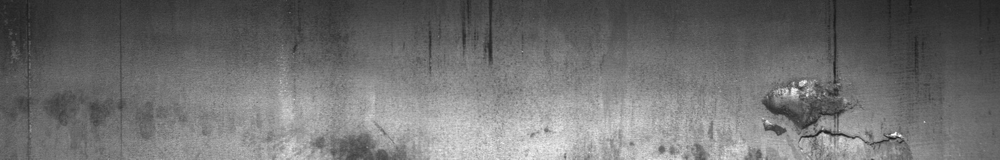

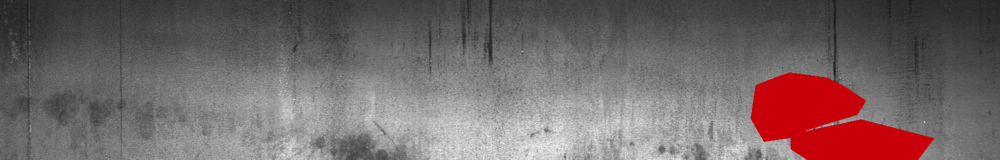

In [14]:
def imageshow(imageid):
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    img = mpimg.imread(images_path + imageid).transpose(-1,0,1)
    img[0, image_mask == 1] = 200
    img[1, image_mask == 1] = 0
    img[2, image_mask == 1] = 9
    print(f'Number of Defect Pixels: {round(image_mask.sum())} out of {256*1600} pixels.')
    display(Image.open(images_path + imageid))
    display(Image.fromarray(img.transpose(1,2,0)))

np.random.seed(23)

for i in range(1):
    imageid = np.random.choice(image_list)
    imageshow(imageid)

📌 There are a total of 801 images, which are split into 741, 30, 30 as train, validation, and test sets.

In [15]:
np.random.seed(39)
print(len(image_list))

n = 30 #val and test

val = list(np.random.choice(image_list, n, replace = False))
train = list(set(image_list) - set(val))
test = list(np.random.choice(train, n, replace = False))
train = list(set(train) - set(test))

for l in train, val, test:
    print(len(l))
    
print(test[:20])

801
741
30
30
['ff9d46e95.jpg', '1a382baf6.jpg', 'bd01b8daf.jpg', 'db3ce9c95.jpg', 'e4e9700de.jpg', '8de7a3873.jpg', '949a23e72.jpg', '30ed4ed02.jpg', '1a3cb1bfc.jpg', 'ee83f88d5.jpg', '2749c24a9.jpg', '1fdef786c.jpg', 'd43c06a93.jpg', '479ec009a.jpg', '5c8104408.jpg', 'cbfeaed02.jpg', '904677cea.jpg', '80842d229.jpg', 'b38f593fd.jpg', '94bf15000.jpg']


📌**Crops**
As I mentioned before, each image is <ins>256 x 1600</ins>. What I am going to do is, for each of the train, validation, test set, I am going to take multiple crops within each image. **Each crop** will be of size **256 x 256**. Now, that means that the whole range of height will be cropped, but horizontally, the width will have a starting index, that stretches rightward by 256 pixels. Thus, if I took 450 as the index, then 450~705 would be the range of indices that would be cropped from the width dimension. You can see below that I have taken 33 crop locations from the train set, and 12 crop locations from each of the validation and test sets.

In [16]:
train_pos = []
valtest_pos = []

for i in range(0,32):
    train_pos.append(i * 40)
    
train_pos.append(1344)

for j in range(0,11):
    valtest_pos.append(j * 130)

valtest_pos.append(1344)

print(len(train_pos))
print(len(valtest_pos))

33
12


Now, I'm not going to take all of the crops of the images. I will specifically choose cropped images that contain more than 12000 (for train) or 5000 (for val and test) pixels that have defects. Thus we end up with train: 4661 crops, val: 102, and test: 121. I have stored the imageid with its 'cropping location(on the width axis)' as 'expanded lists'. These lists will be used as part of the dataloaders.

In [17]:
train_expanded = []
val_expanded = []
test_expanded = []

for imageid in train:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in train_pos:
        
        if image_mask[:,p:p+256].sum() > 12000:
            
            train_expanded.append(imageid + '_' + str(p))
            
for imageid in val:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in valtest_pos:
        
        if image_mask[:,p:p+256].sum() > 5000:
            
            val_expanded.append(imageid + '_' + str(p))

for imageid in test:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in valtest_pos:
        
        if image_mask[:,p:p+256].sum() > 5000:
            
            test_expanded.append(imageid + '_' + str(p))
            
print(len(train_expanded))
print(len(val_expanded))
print(len(test_expanded))

4652
102
108


I have used **dataset-wide** normalization of the images. The values have been pre-computed and copy-pasted below in the code as MEAN and STD. Firstly, the images in the dataset, though in 3 dimensions, are actually one-dimensional (gray-scale?). The R, G, B channels all have the same values. So firstly, you can reduce the image from a **3 x 256 x 256** to a **1 x 256 x 256** dimension. Each image then has a mean pixel value. This mean is calculated over the entire dataset (actually just the train), and then the mean of those means is computed, which is the 'MEAN' value below. Then, STD is calculated by calculating the following:

$$STD = \sqrt{\frac{1}{n_{t}} \sum_{i=1}^{n_{t}} \frac{1}{256 \times 256} \sum_{j=1}^{all pixels} (x_{j} - MEAN)^2}$$

where $n_{t}$ is the number of train images.

In the code, there is a transformation called 'ToTensor()' which scales the image from 0-255 to 0-1 scale, so we should keep that in mind when we compute. In addition to having more crops, for the training data, each image will randomly be vertically flipped, and then independently, randomly be horizontally flipped. The Custom Datasets and Dataloaders are created for train, val, and test.

In [18]:
MEAN =  99.45881939063021
STD =  50.285401061795476

t1 = transforms.ToTensor()
vf = transforms.RandomVerticalFlip()
hf = transforms.RandomHorizontalFlip()

class data(Dataset):
    
    def __init__(self, list_expanded, data_type): 
                    #data_type: 'train', 'val', or 'test.
        
        self.list_expanded = list_expanded
        self.data_type = data_type
    
    def __len__(self):
        
        return len(self.list_expanded)
    
    def __getitem__(self, idx):
        
        imageid = self.list_expanded[idx].split('_')[0]
        p =  int(self.list_expanded[idx].split('_')[1])
        image = Image.open(images_path + imageid)

        m = MEAN/255
        s = STD/255

        t2 = transforms.Normalize(mean = m , std = s)

        img_tensor = t2(t1(image)[0].unsqueeze(0))

        X_ = img_tensor[:, :, p : p + 256]

        pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
        image_mask = pix_to_mat(pixels, 256, 1600)
        y_ = torch.tensor(image_mask).unsqueeze(0)[:, :, p : p + 256]
        
        if self.data_type == 'train':
            
            if np.random.randint(1,3) == 1:
                X_ = vf(X_)  
                y_ = vf(y_)

            if np.random.randint(1,3) == 1:
                X_ = hf(X_)
                y_ = hf(y_)

        return X_, y_

torch.manual_seed(6)
    
traindata = data(train_expanded, 'train')
valdata = data(val_expanded, 'val')
testdata = data(test_expanded, 'test') 

trainloader = DataLoader(traindata, batch_size = 16, shuffle = True)
valloader = DataLoader(valdata, batch_size = len(val_expanded))
testloader = DataLoader(testdata, batch_size = len(test_expanded))

## 2. Model Building and Training ##

For Training, **Dice-BCE Loss** will be used. This is a combined-loss with Binary Cross Entropy and Dice Loss. This will be used for training the model.

For evaluation metric, I will be taking the **mean Dice-Coefficient** for all of the validation (or test) examples. A Dice coefficient for a given two images, say A: predictions, and B: true values, is:

$$ \frac {2 |A \cap B|} {|A| + |B|} $$


Take the following as an example:

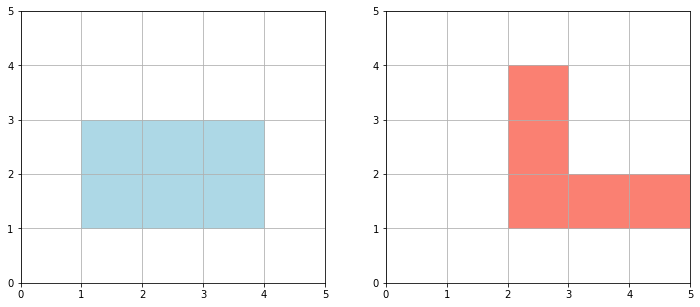

In [19]:
fig, axes = plt.subplots(1, 2, figsize = (12, 5))

for i in range(2):
    axes[i].set_xlim(0, 5)
    axes[i].set_ylim(0, 5)
    axes[i].grid(True)

axes[0].plot()
rect1 = matplotlib.patches.Rectangle((1,1), 3, 2, color='lightblue')
rect2 = matplotlib.patches.Rectangle((2,1), 1, 3, color='salmon')
rect3 = matplotlib.patches.Rectangle((3,1), 2, 1, color='salmon')
axes[0].add_patch(rect1)
axes[1].add_patch(rect2)
axes[1].add_patch(rect3)
plt.show()

Say the that an image is 5 x 5 = 25 pixels in total. The blue squares are prediction. The red squares are true locations of defects. In this case, the Dice - Coefficient for this pair of images would be:

$$\frac{2 \times intersection}{Blue + Red} = \frac{2 \times 3}{6 + 5} = 0.545$$

The evaluation metric is the mean of Dice Coefficients computed each for pair of a prediction and a true values (matrices).

The following code has been taken from the notebook previously mentioned.

In [20]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1): 
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE

This is a modified version of the U-Net Architecture, where the features of channels for the convolutions are smaller, and the same paddings are applied. The skip connections will not be cropped.

In [21]:
if torch.cuda.is_available():
    device = 'cuda'
    
print(device)

class DoubleConvs(nn.Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.ic = in_channels
        self.oc = out_channels
        self.conv1 = nn.Conv2d(self.ic, self.oc, kernel_size = 3, padding = 1) 
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(self.oc, self.oc, kernel_size = 3, padding = 1) 
        self.relu2 = nn.ReLU()
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        
        return x

class UNet(nn.Module):
    
    def __init__(self):
        
        super().__init__()
        
        self.cs = [1,32,64,128,256,512]
        self.DownConvs = nn.ModuleList(DoubleConvs(self.cs[i],self.cs[i+1]) for i in range(4))
        self.DownPools = nn.ModuleList(nn.MaxPool2d(kernel_size = 2, stride = 2) for i in range(4))
        self.Bottleneck = DoubleConvs(256,512)
        self.UpConvs = nn.ModuleList(DoubleConvs(self.cs[i], self.cs[i-1]) for i in range(5,1,-1))
        self.Ups = nn.ModuleList(nn.ConvTranspose2d(self.cs[i], self.cs[i-1], kernel_size = 2, stride = 2) for i in range(5,1,-1))
        self.FinalConv = nn.Conv2d(32, 1, kernel_size = 3, padding = 1)
        self.Sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        
        skip_connections = []
            
        for i in range(4):
            x = self.DownConvs[i](x)
            skip_connections.append(x)
            x = self.DownPools[i](x)
            
        x = self.Bottleneck(x)
        
        skip_connections.reverse()
        
        for i in range(4):
            x = self.Ups[i](x)
            x = torch.cat([x, skip_connections[i]], dim = 1)
            x = self.UpConvs[i](x)
        
        x = self.FinalConv(x)
        x = self.Sigmoid(x)
        
        return x

torch.manual_seed(5)
model = UNet().to(device)

loss_fn = DiceBCELoss()

learning_rate = 0.0001
optimizer = optim.Adam(model.parameters(), lr = learning_rate)

W = [k for k in model.state_dict().keys() if '.weight' in k] #Convolution Weights
B = [k for k in model.state_dict().keys() if '.bias' in k] #Convolution Biases

for w in W:
    nn.init.kaiming_uniform_(model.state_dict()[w], a=0, mode='fan_in', nonlinearity='relu')
    
for b in B:
    nn.init.zeros_(model.state_dict()[b])

cuda


📌 Four functions are defined below: Overfitting a minibatch function, validation and test(which return the evaluation metrics for validation and test sets), and train (which trains a given number of epochs).

In [22]:
def overfit_minibatch():

    model.train()

    X, y = next(iter(trainloader))
    X, y = X.to(device)[0].unsqueeze(0), y.to(torch.float32).to(device)[0].unsqueeze(0)

    for i in tqdm(range(1000)):
        y_pred = model(X)
        loss = loss_fn(y_pred, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if (i+1) % 100 == 0:
            sleep(0.5)
            print(loss.item())
            
def validation(th): #th is the threshold for getting the binary output (1:defect, 0:no defect)

    V_dice = 0

    X, y = next(iter(valloader))

    model.eval()

    with torch.no_grad():

        for n in range(len(valdata)):
            
            y_pred = model(X[n].unsqueeze(0).to(device))
            m1 = y[n].numpy().squeeze()
            m2 = 1 * (y_pred.cpu().numpy().squeeze() >= th)
            v_dice = 2*(m1 * m2).sum()/(m1.sum() + m2.sum())
            V_dice += v_dice
            
    model.train()

    return V_dice / len(valdata)

def test(th):

    T_dice = 0

    X, y = next(iter(testloader))

    model.eval()

    with torch.no_grad():

        for n in range(len(testdata)):
            
            y_pred = model(X[n].unsqueeze(0).to(device))
            m1 = y[n].numpy().squeeze()
            m2 = 1 * (y_pred.cpu().numpy().squeeze() >= th)
            t_dice = 2*(m1 * m2).sum()/(m1.sum() + m2.sum())
            T_dice += t_dice

    return T_dice / len(testdata)

def train(epochs):
    
    model.train()
    
    for i in range(epochs):
        
        L = 0
        
        for batch, (X,y) in tqdm(enumerate(trainloader)):
            
            X, y = X.to(device), y.to(torch.float32).to(device)
            y_pred = model(X)
            loss = loss_fn(y_pred, y)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            L += loss.item()
    
        train_loss = L/len(trainloader)
        val_dice = validation(0.5)
        print(f'epoch {i+1}, train_loss(dice-bce):{train_loss}, val_dice_coef:{val_dice}')

In [23]:
#This can be uncommented and run
#overfit_minibatch()

📌 Initial Validation Loss:

In [44]:
validation(0.5)

0.16328838729145134

📌 Model is trained for 10 epochs.

In [45]:
train(20)

1it [00:00,  6.36it/s]


epoch 1, train_loss(dice-bce):1.8157893419265747, val_dice_coef:0.14876536329697773


1it [00:00,  7.90it/s]


epoch 2, train_loss(dice-bce):1.5369905233383179, val_dice_coef:0.13056980777017305


1it [00:00,  7.91it/s]


epoch 3, train_loss(dice-bce):1.4118566513061523, val_dice_coef:0.10350633022160573


1it [00:00,  7.92it/s]


epoch 4, train_loss(dice-bce):1.3553650379180908, val_dice_coef:0.05804508273490947


1it [00:00,  8.08it/s]


epoch 5, train_loss(dice-bce):1.3137011528015137, val_dice_coef:0.03184523134065208


1it [00:00,  7.87it/s]


epoch 6, train_loss(dice-bce):1.324259877204895, val_dice_coef:0.019668553582273186


1it [00:00,  8.21it/s]


epoch 7, train_loss(dice-bce):1.3097126483917236, val_dice_coef:0.014793919906311724


1it [00:00,  7.86it/s]


epoch 8, train_loss(dice-bce):1.2923226356506348, val_dice_coef:0.012113350940221035


1it [00:00,  7.95it/s]


epoch 9, train_loss(dice-bce):1.279858112335205, val_dice_coef:0.01099829192759612


1it [00:00,  7.98it/s]


epoch 10, train_loss(dice-bce):1.348382592201233, val_dice_coef:0.010437193397821148


1it [00:00,  8.10it/s]


epoch 11, train_loss(dice-bce):1.2786660194396973, val_dice_coef:0.00961550647660013


1it [00:00,  8.03it/s]


epoch 12, train_loss(dice-bce):1.2433428764343262, val_dice_coef:0.009225514290984164


1it [00:00,  8.05it/s]


epoch 13, train_loss(dice-bce):1.2510977983474731, val_dice_coef:0.008581596873222814


1it [00:00,  8.08it/s]


epoch 14, train_loss(dice-bce):1.3081450462341309, val_dice_coef:0.008601189599613134


1it [00:00,  7.96it/s]


epoch 15, train_loss(dice-bce):1.3298511505126953, val_dice_coef:0.008235101965403821


1it [00:00,  7.98it/s]


epoch 16, train_loss(dice-bce):1.2725415229797363, val_dice_coef:0.0076936080749284395


1it [00:00,  7.92it/s]


epoch 17, train_loss(dice-bce):1.264708161354065, val_dice_coef:0.007630829268497653


1it [00:00,  8.07it/s]


epoch 18, train_loss(dice-bce):1.2023594379425049, val_dice_coef:0.007103745634936515


1it [00:00,  8.03it/s]


epoch 19, train_loss(dice-bce):1.3353580236434937, val_dice_coef:0.006300524796875005


1it [00:00,  8.13it/s]


epoch 20, train_loss(dice-bce):1.230767011642456, val_dice_coef:0.006312634953509157


## 3. Prediction on the Test Set ##

Below is the val_test_show function, which randomly samples an image from validation or test (of your choice) with a given threshold for binary prediction, where you can see how the true defect pixels compare with the model's predictions, along with the dice coefficient.

The **val_test_show** function works in the following way:
Parameters: <ins>val_test</ins> and <ins>th</ins>.
val_test is the string that determines if I want to show predictions in the validation or test set.
th is the threshold that will be used to round the output probability (of the Sigmoid layer) to 1(defect) or 0(no defect).

When the function is run, a random image (along with the crop position) is picked from either validation or test set. Then, the cropped image along with its respective cropped mask are obtained. Next, the predicted mask is also obtained through the forward pass of the input through the model. Then, the image, its true mask(<span style="color:green">green</span>), its predicted mask(<span style="color:blue">blue</span>) are shown.

In [24]:
def val_test_show(val_test, th):
    
    if val_test == 'val':
        r = np.random.randint(0,len(val_expanded))
        imageid_p = val_expanded[r]
    
    if val_test == 'test':
        r = np.random.randint(0,len(test_expanded))
        imageid_p = test_expanded[r]
        
    imageid = imageid_p.split('_')[0]
    p = int(imageid_p.split('_')[1])
    image = Image.open(images_path + imageid)

    m = MEAN/255
    s = STD/255

    t2 = transforms.Normalize(mean = m , std = s)

    img_tensor = t2(t1(image)[0].unsqueeze(0))

    X_ = img_tensor[:, :, p : p + 256]

    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()

    mask = pix_to_mat(pixels, 256, 1600)[:,p:p+256]

    model.eval()

    with torch.no_grad():
        y_pred = model(X_.unsqueeze(0).to(device))

    pred_mask = y_pred.cpu().numpy().squeeze()

    img_matrix = (mpimg.imread(images_path+imageid).transpose(-1,0,1)[:,:, p : p +256].transpose(1,2,0))

    img_y = img_matrix.copy()
    img_y = img_y.transpose(-1,0,1)
    img_y[0, mask == 1] = 85
    img_y[1, mask == 1] = 213
    img_y[2, mask == 1] = 90
    img_y = img_y.transpose(1,2,0)

    img_pred = img_matrix.copy()
    img_pred = img_pred.transpose(-1,0,1)
    img_pred[0, pred_mask >= th] = 63
    img_pred[1, pred_mask >= th] = 107
    img_pred[2, pred_mask >= th] = 208
    img_pred = img_pred.transpose(1,2,0)
    
    pred = 1 * (pred_mask >= th)
    dice = 2 * (pred * mask).sum() / (pred.sum() + mask.sum())
    print(f'Dice Coefficient: {dice}')
    print(f'p: {p}')
    print(f'imageid_p: {imageid_p}')

    display(Image.fromarray(img_matrix))
    display(Image.fromarray(img_y))
    display(Image.fromarray(img_pred))

Firstly, the test evaluation metric (mean dice-coefficient) is:

In [25]:
test(0.5)

0.4142259408645981

Finally, here are 7 examples from the test images in the following order:
Each (cropped) image is given as three images:

The cropped image, true defect pixels (<span style="color:green">green</span>) , and predicted pixels (<span style="color:blue">blue</span>).

Dice Coefficient: 0.7461547704878635
p: 780
imageid_p: 5b202c6f5.jpg_780


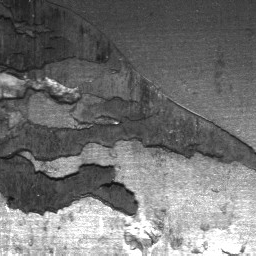

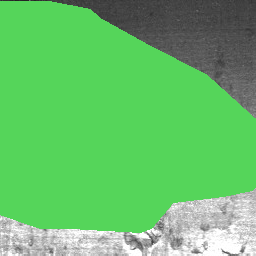

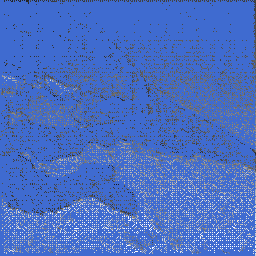

Dice Coefficient: 0.5094319766371123
p: 780
imageid_p: 94bf15000.jpg_780


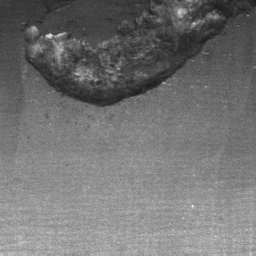

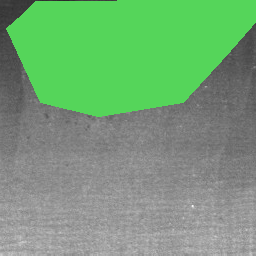

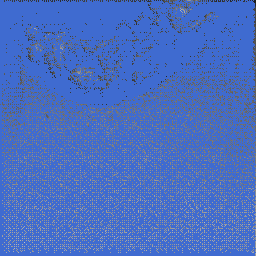

Dice Coefficient: 0.7198681631158312
p: 1040
imageid_p: 49da138ee.jpg_1040


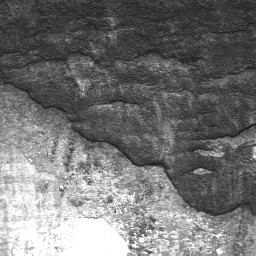

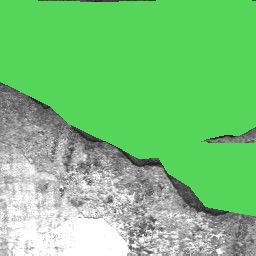

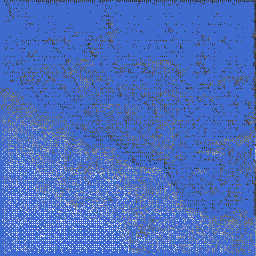

Dice Coefficient: 0.2406505749507925
p: 260
imageid_p: 52d0d8da4.jpg_260


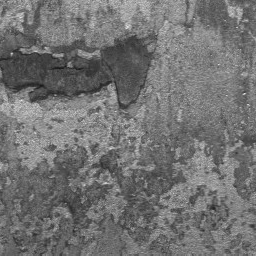

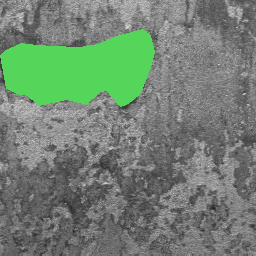

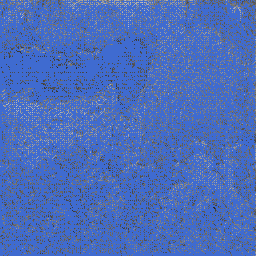

Dice Coefficient: 0.6630548838906885
p: 910
imageid_p: 80842d229.jpg_910


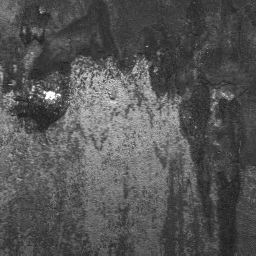

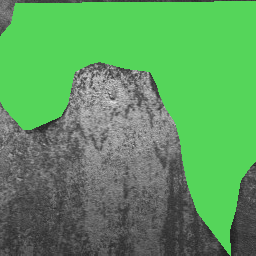

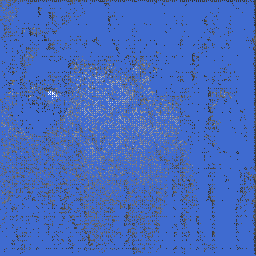

In [26]:
for i in range(5):
    val_test_show('test',0.5)

In [27]:
# Inference using the saved model


In [28]:
model = torch.load('/kaggle/input/model-class-4/image_defect_4.pt')
model.eval()

UNet(
  (DownConvs): ModuleList(
    (0): DoubleConvs(
      (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU()
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU()
    )
    (1): DoubleConvs(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU()
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU()
    )
    (2): DoubleConvs(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU()
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU()
    )
    (3): DoubleConvs(
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU()
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU()
    )
  )
  (DownPools): Module

In [ ]:
ff6bfada2.jpg

In [17]:
def val_inference(image_id, th):
    
    val_test = 'test'
    
    if val_test == 'val':
        r = np.random.randint(0,len(val_expanded))
        imageid_p = val_expanded[r]
    
    if val_test == 'test':
        r = np.random.randint(0,len(test_expanded))
        imageid_p = test_expanded[r]
        
    imageid = image_id
    p = int(imageid_p.split('_')[1])
    img_crop_mat = [0, 260,520, 780, 1040, 1300]
    image = Image.open(images_path + image_id)
    m = MEAN/255
    s = STD/255
    
    t2 = transforms.Normalize(mean = m , std = s)
    
    img_tensor = t2(t1(image)[0].unsqueeze(0))
    
    #final_img_matrix = [[[]]]

    for i in range(len(img_crop_mat)):
        p = img_crop_mat[i]
        X_ = img_tensor[:, :, p : p + 256]
        pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
        mask = pix_to_mat(pixels, 256, 1600)[:,p:p+256]
        model.eval()
        with torch.no_grad():
            y_pred = model(X_.unsqueeze(0).to(device))
        pred_mask = y_pred.cpu().numpy().squeeze()
    
        img_matrix = (mpimg.imread(images_path+image_id).transpose(-1,0,1)[:,:, p : p +256].transpose(1,2,0))
        
        #final_img_matrix.append(img_matrix)

        img_y = img_matrix.copy()
        img_y = img_y.transpose(-1,0,1)
        img_y[0, mask == 1] = 85
        img_y[1, mask == 1] = 213
        img_y[2, mask == 1] = 90
        img_y = img_y.transpose(1,2,0)

        img_pred = img_matrix.copy()
        img_pred = img_pred.transpose(-1,0,1)
        img_pred[0, pred_mask >= th] = 200
        img_pred[1, pred_mask >= th] = 9
        img_pred[2, pred_mask >= th] = 8
        img_pred = img_pred.transpose(1,2,0)
    
        pred = 1 * (pred_mask >= th)
        dice = 2 * (pred * mask).sum() / (pred.sum() + mask.sum())
        
        # concatenate the value of the images
        if 'final_img_matrix' not in locals():
            # Create a new variable with a value
            final_img_matrix = img_matrix.copy()
        else:
                # Concatenate another list or value
            final_img_matrix = np.concatenate((final_img_matrix, img_matrix), axis=1)
            
        if 'final_img_pred' not in locals():
            # Create a new variable with a value
            final_img_pred = img_pred.copy()
        else:
                # Concatenate another list or value
            final_img_pred = np.concatenate((final_img_pred, img_pred), axis=1)
        
        if 'final_img_y' not in locals():
            # Create a new variable with a value
            final_img_y = img_y.copy()
        else:
                # Concatenate another list or value
            final_img_y = np.concatenate((final_img_y, img_y), axis=1)
        
        
        print(f'Dice Coefficient: {dice}')
        print(f'p: {p}')
        print(f'imageid_p: {imageid_p}')
        
    display(Image.fromarray(final_img_matrix))
    display(Image.fromarray(final_img_y))
    display(Image.fromarray(final_img_pred))

In [257]:
img_crop_mat = [0, 260,520, 780]
np.random.randint(0,len(img_crop_mat))

3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in double_scalars


Dice Coefficient: nan
p: 0
imageid_p: 48c466789.jpg_520
Dice Coefficient: 0.0
p: 260
imageid_p: 48c466789.jpg_520
Dice Coefficient: 0.8060580007274891
p: 520
imageid_p: 48c466789.jpg_520
Dice Coefficient: 0.5941006929539462
p: 780
imageid_p: 48c466789.jpg_520
Dice Coefficient: 0.0
p: 1040
imageid_p: 48c466789.jpg_520
Dice Coefficient: 0.0
p: 1300
imageid_p: 48c466789.jpg_520


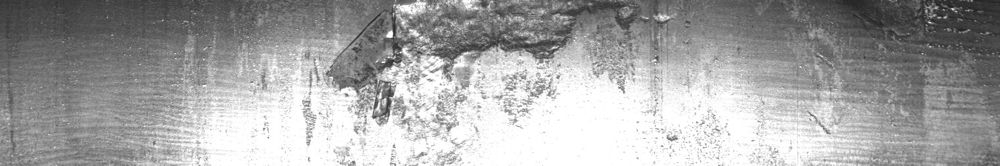

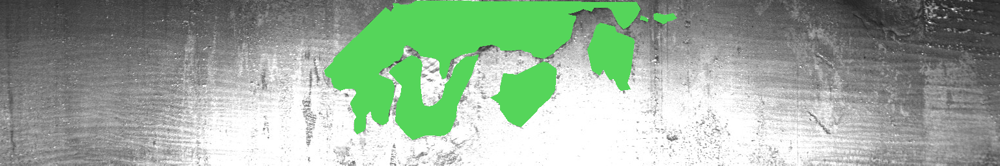

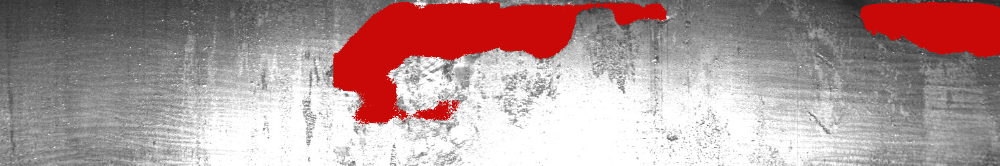

In [18]:
val_inference('fda1a539d.jpg',0.5)

In [30]:
# save model for inference 
torch.save(model, 'cls_1_model.pt')

In [268]:
def image_inference(image_path, th):
    
    img_crop_mat = [0, 260,520, 780, 1040, 1300]
    image = Image.open(image_path)
    m = MEAN/255
    s = STD/255
    
    t2 = transforms.Normalize(mean = m , std = s)
    
    img_tensor = t2(t1(image)[0].unsqueeze(0))
    
    #final_img_matrix = [[[]]]

    for i in range(len(img_crop_mat)):
        p = img_crop_mat[i]
        X_ = img_tensor[:, :, p : p + 256]
        model.eval()
        with torch.no_grad():
            y_pred = model(X_.unsqueeze(0).to(device))
        pred_mask = y_pred.cpu().numpy().squeeze()
    
        img_matrix = (mpimg.imread(image_path).transpose(-1,0,1)[:,:, p : p +256].transpose(1,2,0))
        

        img_pred = img_matrix.copy()
        img_pred = img_pred.transpose(-1,0,1)
        img_pred[0, pred_mask >= th] = 63
        img_pred[1, pred_mask >= th] = 107
        img_pred[2, pred_mask >= th] = 208
        img_pred = img_pred.transpose(1,2,0)
    
        pred = 1 * (pred_mask >= th)
        #dice = 2 * (pred * mask).sum() / (pred.sum() + mask.sum())
        
        # concatenate the value of the images
        if 'final_img_matrix' not in locals():
            # Create a new variable with a value
            final_img_matrix = img_matrix.copy()
        else:
                # Concatenate another list or value
            final_img_matrix = np.concatenate((final_img_matrix, img_matrix), axis=1)
            
        if 'final_img_pred' not in locals():
            # Create a new variable with a value
            final_img_pred = img_pred.copy()
        else:
                # Concatenate another list or value
            final_img_pred = np.concatenate((final_img_pred, img_pred), axis=1)
        
        #print(f'Dice Coefficient: {dice}')
        print(f'p: {p}')
        
    display(Image.fromarray(final_img_matrix))
    display(Image.fromarray(final_img_pred))

p: 0
p: 260
p: 520
p: 780
p: 1040
p: 1300


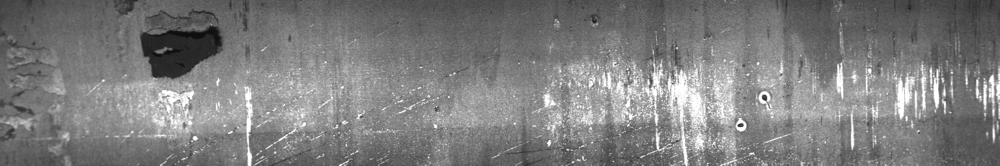

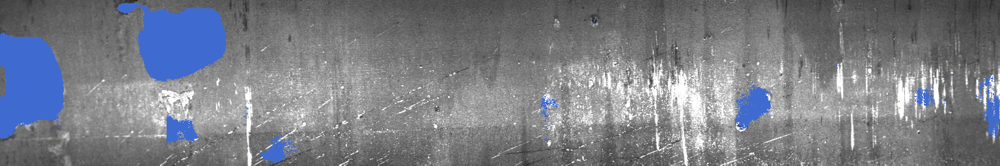

In [269]:
image_inference('/kaggle/input/severstal-steel-defect-detection/train_images/4dd52fc23.jpg',0.5)

## Training model for other class

In [274]:
tab = pd.read_csv(folder_path+'train.csv')
c = 1
tab = tab[tab['ClassId'] == c].copy()
tab = tab.reset_index().drop('index', axis = 1)
image_list = tab['ImageId'].unique()
tab

,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
2,002fc4e19.jpg,1,146021 3 146275 10 146529 40 146783 46 147038 ...
3,008ef3d74.jpg,1,356336 4 356587 11 356838 18 357089 25 357340 ...
4,00ac8372f.jpg,1,101742 3 101998 12 102253 19 102301 22 102509 ...
...,...,...,...
892,fe8e137c0.jpg,1,28022 19 28259 38 28515 38 28772 37 29028 37 2...
893,fea4c4feb.jpg,1,348577 3 348831 8 349085 12 349339 17 349593 1...
894,fed07ccf3.jpg,1,371057 12 371312 17 371567 22 371821 26 372076...
895,ff001adfe.jpg,1,36426 3 36682 7 36938 11 37194 16 37450 20 377...


Number of Defect Pixels: 5232 out of 409600 pixels.


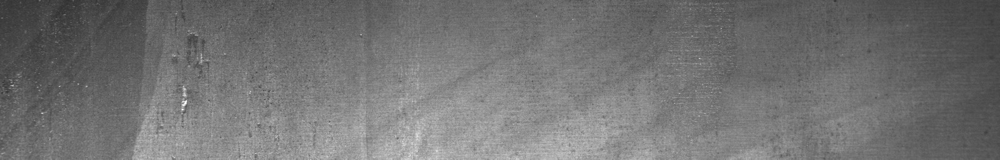

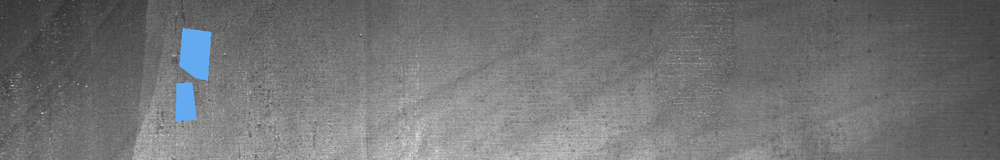

Number of Defect Pixels: 1267 out of 409600 pixels.


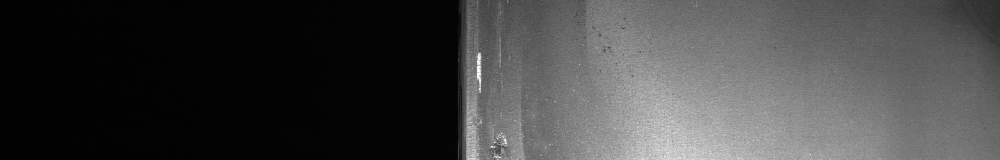

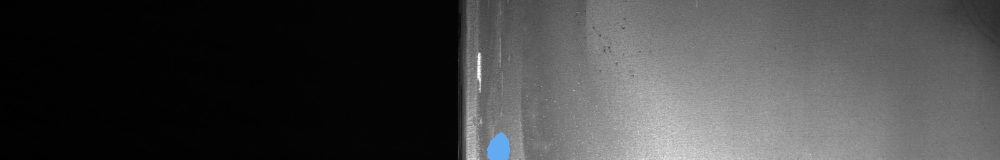

Number of Defect Pixels: 1943 out of 409600 pixels.


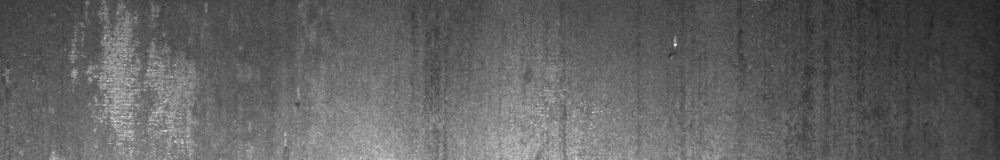

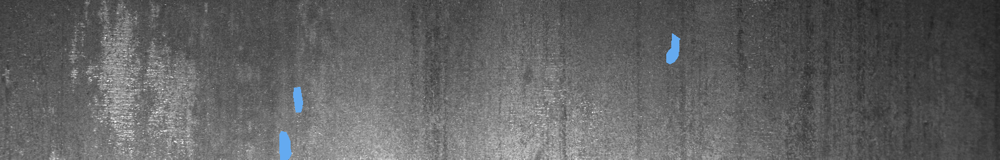

In [283]:
def imageshow(imageid):
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    img = mpimg.imread(images_path + imageid).transpose(-1,0,1)
    img[0, image_mask == 1] = 100
    img[1, image_mask == 1] = 170
    img[2, image_mask == 1] = 240
    print(f'Number of Defect Pixels: {round(image_mask.sum())} out of {256*1600} pixels.')
    display(Image.open(images_path + imageid))
    display(Image.fromarray(img.transpose(1,2,0)))

np.random.seed(23)

for i in range(3):
    imageid = np.random.choice(image_list)
    imageshow(imageid)

In [294]:
np.random.seed(39)
print(len(image_list))

n = 30 #val and test

val = list(np.random.choice(image_list, n, replace = False))
train = list(set(image_list) - set(val))
test = list(np.random.choice(train, n, replace = False))
train = list(set(train) - set(test))

for l in train, val, test:
    print(len(l))
    
print(test[:2])

897
837
30
30
['607105dac.jpg', '9202ebeb6.jpg']


In [285]:
train_pos = []
valtest_pos = []

for i in range(0,32):
    train_pos.append(i * 40)
    
train_pos.append(1344)

for j in range(0,11):
    valtest_pos.append(j * 130)

valtest_pos.append(1344)

print(len(train_pos))
print(len(valtest_pos))

33
12


In [286]:
train_expanded = []
val_expanded = []
test_expanded = []

for imageid in train:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in train_pos:
        
        if image_mask[:,p:p+256].sum() > 12000:
            
            train_expanded.append(imageid + '_' + str(p))
            
for imageid in val:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in valtest_pos:
        
        if image_mask[:,p:p+256].sum() > 5000:
            
            val_expanded.append(imageid + '_' + str(p))

for imageid in test:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in valtest_pos:
        
        if image_mask[:,p:p+256].sum() > 5000:
            
            test_expanded.append(imageid + '_' + str(p))
            
print(len(train_expanded))
print(len(val_expanded))
print(len(test_expanded))

47
8
9


In [288]:
overfit_minibatch()

 11%|█         | 112/1000 [00:02<00:23, 38.08it/s]

1.1995766162872314


 21%|██        | 212/1000 [00:04<00:21, 37.36it/s]

1.1995766162872314


 31%|███▏      | 313/1000 [00:06<00:18, 37.34it/s]

1.1995766162872314


 41%|████▏     | 413/1000 [00:08<00:16, 36.57it/s]

1.1995766162872314


 51%|█████▏    | 513/1000 [00:10<00:13, 37.23it/s]

1.1995766162872314


 61%|██████▏   | 613/1000 [00:11<00:10, 37.20it/s]

1.1995766162872314


 71%|███████▏  | 713/1000 [00:13<00:07, 37.23it/s]

1.1995766162872314


 81%|████████▏ | 813/1000 [00:15<00:05, 37.23it/s]

1.1995766162872314


 90%|█████████ | 904/1000 [00:17<00:03, 26.01it/s]

1.1995766162872314


100%|██████████| 1000/1000 [00:19<00:00, 50.38it/s]

1.1995766162872314


In [295]:
validation(0.5)

0.11315123219443664

In [306]:
train(20)

3it [00:01,  2.26it/s]


epoch 1, train_loss(dice-bce):1.283029834429423, val_dice_coef:0.11315123219443664


3it [00:01,  2.31it/s]


epoch 2, train_loss(dice-bce):1.2625772555669148, val_dice_coef:0.11315123219443664


3it [00:01,  2.35it/s]


epoch 3, train_loss(dice-bce):1.3063472906748455, val_dice_coef:0.11315123219443664


3it [00:01,  2.38it/s]


epoch 4, train_loss(dice-bce):1.2507155338923137, val_dice_coef:0.11315123219443664


3it [00:01,  2.30it/s]


epoch 5, train_loss(dice-bce):1.221123456954956, val_dice_coef:0.11315123219443664


3it [00:01,  2.36it/s]


epoch 6, train_loss(dice-bce):1.2352070808410645, val_dice_coef:0.11315123219443664


3it [00:01,  2.34it/s]


epoch 7, train_loss(dice-bce):1.2807551622390747, val_dice_coef:0.11315123219443664


3it [00:01,  2.36it/s]


epoch 8, train_loss(dice-bce):1.2604565620422363, val_dice_coef:0.11315123219443664


3it [00:01,  2.41it/s]


epoch 9, train_loss(dice-bce):1.3034440279006958, val_dice_coef:0.11315123219443664


3it [00:01,  2.39it/s]


epoch 10, train_loss(dice-bce):1.2542227109273274, val_dice_coef:0.11315123219443664


3it [00:01,  2.33it/s]


epoch 11, train_loss(dice-bce):1.271774689356486, val_dice_coef:0.11315123219443664


3it [00:01,  2.35it/s]


epoch 12, train_loss(dice-bce):1.1753313938776653, val_dice_coef:0.11315123219443664


3it [00:01,  2.13it/s]


epoch 13, train_loss(dice-bce):1.2390828132629395, val_dice_coef:0.11315123219443664


3it [00:01,  2.31it/s]


epoch 14, train_loss(dice-bce):1.2574606736501057, val_dice_coef:0.11315123219443664


3it [00:01,  2.37it/s]


epoch 15, train_loss(dice-bce):1.3176944653193157, val_dice_coef:0.11315123219443664


3it [00:01,  2.39it/s]


epoch 16, train_loss(dice-bce):1.2144602139790852, val_dice_coef:0.11315123219443664


3it [00:01,  2.36it/s]


epoch 17, train_loss(dice-bce):1.2328142325083415, val_dice_coef:0.11315123219443664


3it [00:01,  2.42it/s]


epoch 18, train_loss(dice-bce):1.2747780084609985, val_dice_coef:0.11315123219443664


3it [00:01,  2.38it/s]


epoch 19, train_loss(dice-bce):1.1946585178375244, val_dice_coef:0.11315123219443664


3it [00:01,  2.39it/s]


epoch 20, train_loss(dice-bce):1.1843820412953694, val_dice_coef:0.11315123219443664


In [307]:
test(0.5)

0.09704536875533482

In [ ]:
for i in range(1):
    val_test_show('test',0.6)

In [318]:
# save model for inference 
torch.save(model, 'cls_1_model.pt')

## Class 3

In [322]:
tab = pd.read_csv(folder_path+'train.csv')
c = 3
tab = tab[tab['ClassId'] == c].copy()
tab = tab.reset_index().drop('index', axis = 1)
image_list = tab['ImageId'].unique()
tab

,ImageId,ClassId,EncodedPixels
0,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
1,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...
2,0025bde0c.jpg,3,8458 14 8707 35 8963 48 9219 71 9475 88 9731 8...
3,0046839bd.jpg,3,152926 1 153180 4 153434 6 153689 8 153943 11 ...
4,005d86c25.jpg,3,331 18 587 53 843 89 1099 124 1355 159 1611 17...
...,...,...,...
5145,ffcf72ecf.jpg,3,121911 34 122167 101 122422 169 122678 203 122...
5146,fff02e9c5.jpg,3,207523 3 207777 9 208030 15 208283 22 208537 2...
5147,fffe98443.jpg,3,105929 5 106177 14 106424 24 106672 33 106923 ...
5148,ffff4eaa8.jpg,3,16899 7 17155 20 17411 34 17667 47 17923 60 18...


Number of Defect Pixels: 33646 out of 409600 pixels.


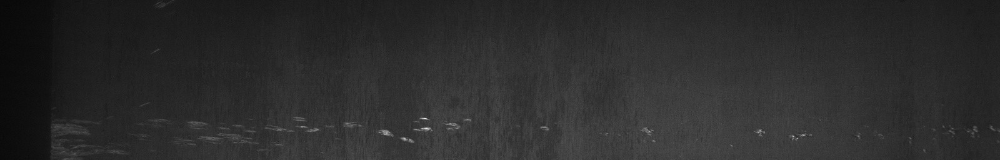

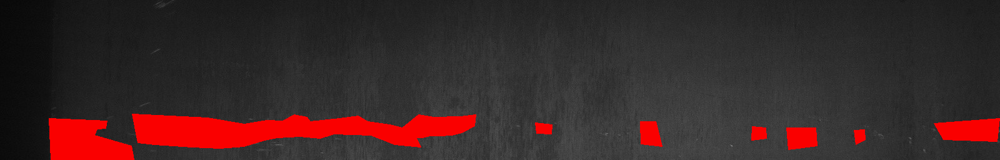

Number of Defect Pixels: 154025 out of 409600 pixels.


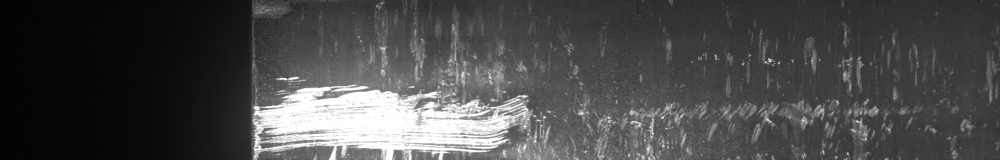

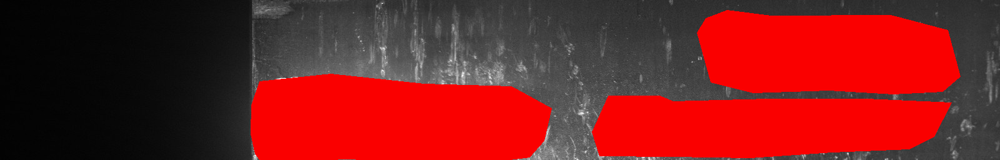

Number of Defect Pixels: 41323 out of 409600 pixels.


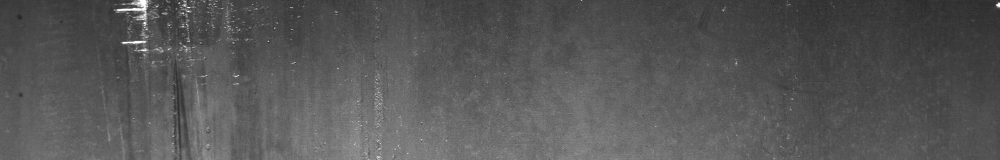

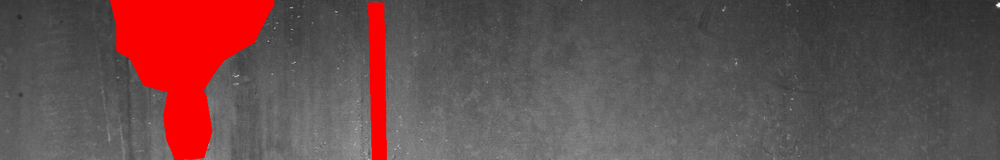

In [323]:
def imageshow(imageid):
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    img = mpimg.imread(images_path + imageid).transpose(-1,0,1)
    img[0, image_mask == 1] = 250
    img[1, image_mask == 1] = 0
    img[2, image_mask == 1] = 0
    print(f'Number of Defect Pixels: {round(image_mask.sum())} out of {256*1600} pixels.')
    display(Image.open(images_path + imageid))
    display(Image.fromarray(img.transpose(1,2,0)))

np.random.seed(23)

for i in range(3):
    imageid = np.random.choice(image_list)
    imageshow(imageid)

In [353]:
np.random.seed(39)
print(len(image_list))

n = 30 #val and test

val = list(np.random.choice(image_list, n, replace = False))
train = list(set(image_list) - set(val))
test = list(np.random.choice(train, n, replace = False))
train = list(set(train) - set(test))

for l in train, val, test:
    print(len(l))
    
print(test[:2])

5150
5090
30
30
['443f8564b.jpg', '362b4c3d0.jpg']


In [354]:
train_pos = []
valtest_pos = []

for i in range(0,32):
    train_pos.append(i * 40)
    
train_pos.append(1344)

for j in range(0,11):
    valtest_pos.append(j * 130)

valtest_pos.append(1344)

print(len(train_pos))
print(len(valtest_pos))

33
12


In [355]:
train_expanded = []
val_expanded = []
test_expanded = []

for imageid in train:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in train_pos:
        
        if image_mask[:,p:p+256].sum() > 12000:
            
            train_expanded.append(imageid + '_' + str(p))
            
for imageid in val:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in valtest_pos:
        
        if image_mask[:,p:p+256].sum() > 5000:
            
            val_expanded.append(imageid + '_' + str(p))

for imageid in test:
    pixels = tab[tab['ImageId'] == imageid]['EncodedPixels'].item()
    image_mask = pix_to_mat(pixels, 256, 1600)
    
    for p in valtest_pos:
        
        if image_mask[:,p:p+256].sum() > 5000:
            
            test_expanded.append(imageid + '_' + str(p))
            
print(len(train_expanded))
print(len(val_expanded))
print(len(test_expanded))

19645
94
84


In [350]:
validation(0.5)

ValueError: can only convert an array of size 1 to a Python scalar

In [359]:
train(5)

0it [00:00, ?it/s]


ValueError: can only convert an array of size 1 to a Python scalar

In [351]:
train(10)

0it [00:00, ?it/s]


ValueError: can only convert an array of size 1 to a Python scalar